# End-to-end Multi-class Dog Breed Classification

this notebook builds an end to end Multi-class image
classifier using TensorFlow and TensorFlow Hub

## 1. Problem
Identifying the breed of a dog given an image of the dog

## 2. Data
The data we are using is from kaggles dog breed
identification competition:

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probalbilities for
each dog breed of each test image:

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We are dealing with unstructured data (images)
* The dataset comprises 120 breeds of dogs (since the breed is the target that means we have 120 classes)
* There are around 10,000+ images in the test set
* There are around 10,000+ images in the train set

## Get our workspace ready

In [ ]:
!pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 72.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 61.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 102.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 35.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 75.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.2 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtype

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display  import Image
import os
from sklearn.model_selection import train_test_split

In [ ]:
#Check for gpu availability
print("GPU",  "Available" if tf.config.list_physical_devices("GPU") else "Not Available")

GPU Available


## Getting our data ready


In [ ]:
#Check out the labels of our data
labels_csv = pd.read_csv("drive/MyDrive/Dog Breed Recognition/labels.csv")

In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


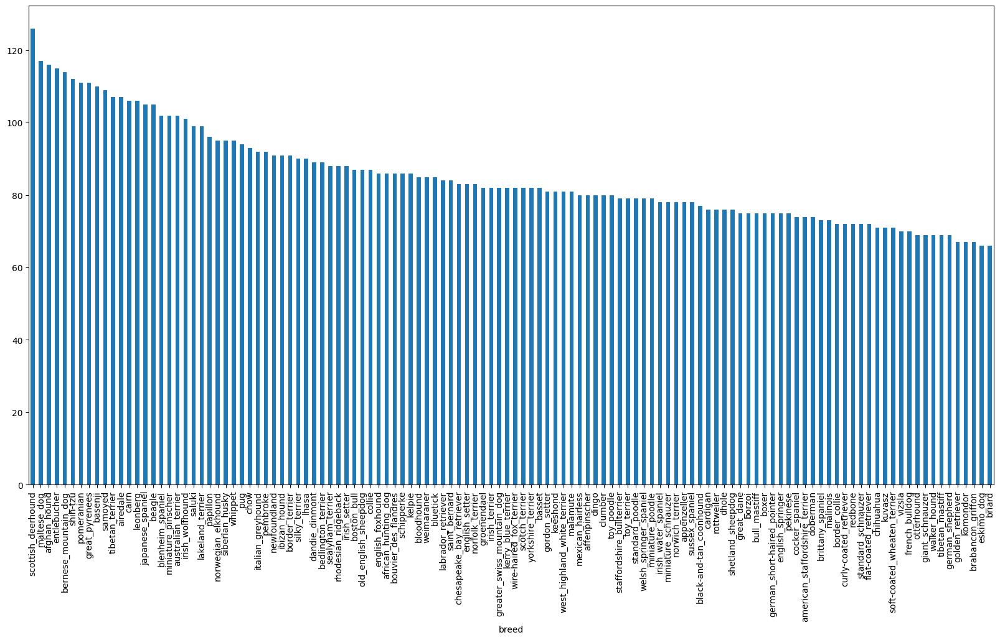

In [ ]:
#How many images are there of each breed

labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

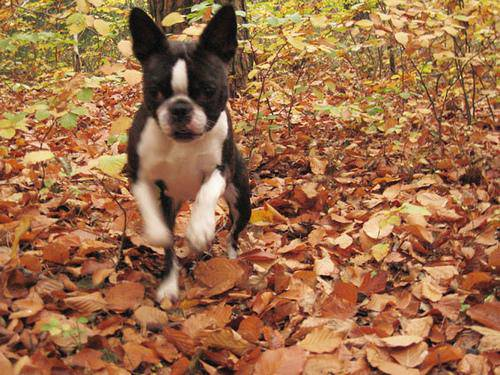

In [ ]:
Image("drive/MyDrive/Dog Breed Recognition/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels

Lets get a list of all of our image file pathnames

In [ ]:
#Create path names from id

filepaths = ["drive/MyDrive/Dog Breed Recognition/train/" + fname for fname in labels_csv["id"] + ".jpg"]

filepaths[:10]

['drive/MyDrive/Dog Breed Recognition/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Breed Recognition/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Breed Recognition/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Breed Recognition/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Breed Recognition/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Breed Recognition/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Breed Recognition/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Breed Recognition/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Breed Recognition/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Breed Recognition/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#Check if number of filepaths = to len of id in labels
len(os.listdir("drive/MyDrive/Dog Breed Recognition/train/")) == len(filepaths)

True

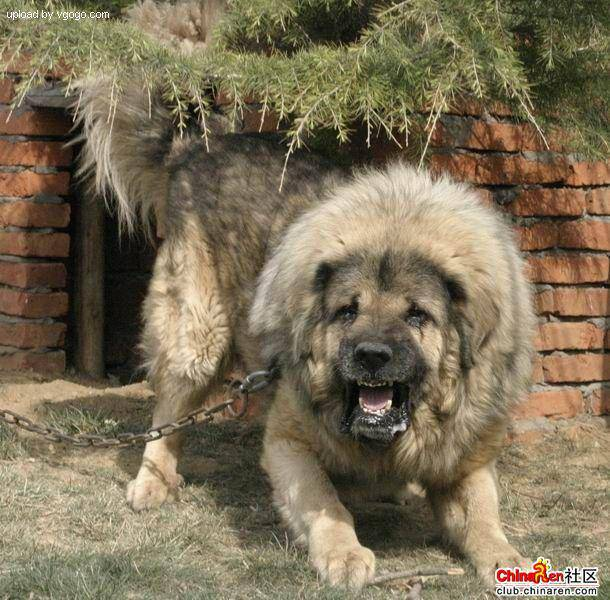

In [ ]:
Image(filepaths[9000])

In [ ]:
labels = labels_csv["breed"].to_numpy()
#labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# check for missing data
len(filepaths) == len(labels)

True

In [ ]:
# find the unique labels
unique_breeds = pd.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [label == unique_breeds for label in labels]
len(boolean_labels)

10222

In [ ]:
#Example: turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([0]),)
0
[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our vaidation set

since kaggle doesnt provide us with a validation set we will make our own

In [ ]:
# Split our data into X & y
X = filepaths
y = boolean_labels

In [ ]:
#Set number of images used for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

we are going to start with 1000 images and increase as needed

In [ ]:
# Split the data to train and validation
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

### Preprocessing images (turning them to tensors)

to preprocess our images to tensors we are gonna write a function which does a few things:
1. Take image filepath as input
2. use tensorflow to read the file and save it to a variable `image`
3. turn our `image` a jpg into a tensor
4. Resize the `images`
5. return modified `image`

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
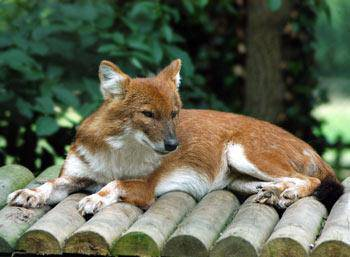

In [ ]:
#convert an image to a numpy array
image1 = plt.imread(filepaths[42])
image1

In [ ]:
tf.constant(image1)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:
#Define image size
IMG_SIZE = 224

# Create preprocessing function

def process_img(image_path):
  """
  Takes image returns tensor
  """
  #Read in an image file
  image = tf.io.read_file(image_path)
  #Turn the jpeg image to numerical tensor with 3 color channels red green blue
  image = tf.image.decode_jpeg(image, channels=3)
  #Convert color channel values from 0-255 into 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  #Resize the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batchs

Why turn our data into batchs

lets say you're trying to process 10000 image in one go they all might not fit into memory

so thats why we do about 32 in a batch

In order to use tensorflow effectivly we need our data in the form of tensor tuples which look like this:
(image, label)

In [ ]:
#Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Returns The Tensor Tuple in proper form
  """
  image = process_img(image_path)
  return (image, label)

Now we have got a way to turn our data into tuples of tensors in the form (image, label) lets make a function to turn all of our data X & y into batchs

In [ ]:
#Define the batch size
BATCH_SIZE = 32

#Create a fucntion to turn data into batchs
def create_data_batchs(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batchs of data out of image (X) and label (y) pairs
  it shuffles the data if its training data but doesnt shuffle
  if its validation data
  also accepts test data as input
  """
  # If the data is a test data set we dont have labels
  if test_data:
    print("Creating test data batchs...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only file paths no labels
    data_batch = data.map(process_img).batch(batch_size)
    return data_batch

  # If the data is a validation dataset we dont need to shuffle it
  elif valid_data:
    print("Creatign validation data batchs...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creatign training data batchs...")
    #Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    #Shuffle the pathsnames and labels before mapping image processor
    data = data.shuffle(buffer_size=len(X))
    #Create image label tuples this also turns the image paths into a preprocessed image
    data = data.map(get_image_label)
    #Turn the training data into batchs
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [ ]:
train_data = create_data_batchs(X_train, y_train)
val_data = create_data_batchs(X_val, y_val, valid_data=True)

Creatign training data batchs...
Creatign validation data batchs...


In [ ]:
#Lets check out the different data attirbutes of our data batchs
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualize our data

Our data in now in batches however these can be a little hard to comprehand so lets visualize it

In [ ]:
#Create a function for viewing images in a data batch

def show_25_images(images, labels):
  """
  displays a plot of 25 images and their labels from the data batch
  """
  plt.figure(figsize=(10,10))
  #loop through 25 for displaying images
  for i in range(25):
    #create subplots
    ax = plt.subplot(5,5, i+1)
    #display image
    plt.imshow(images[i])
    #add image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    #turn the grid lines off
    plt.axis("off")

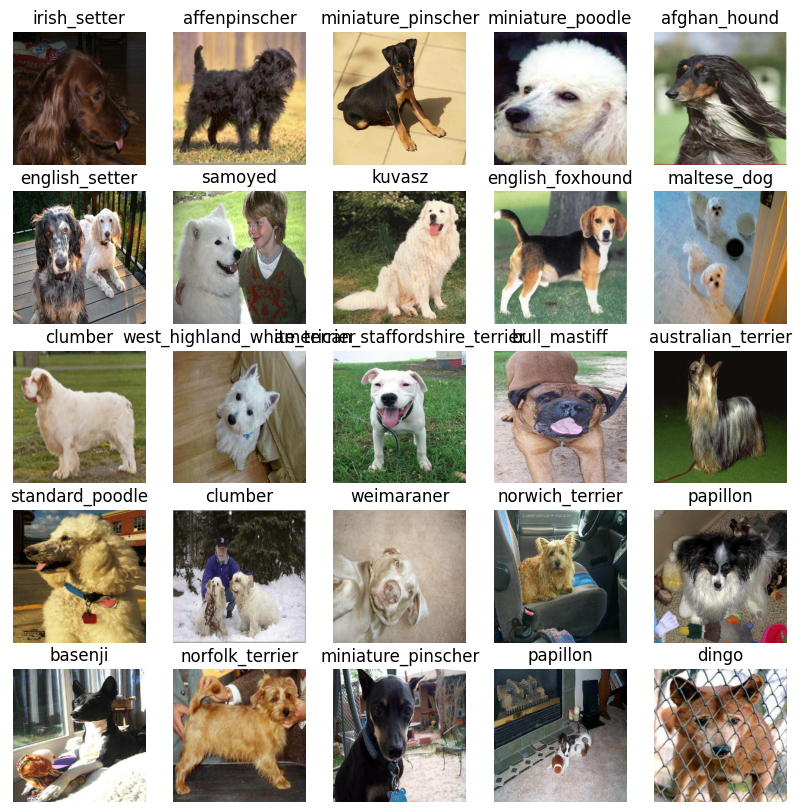

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

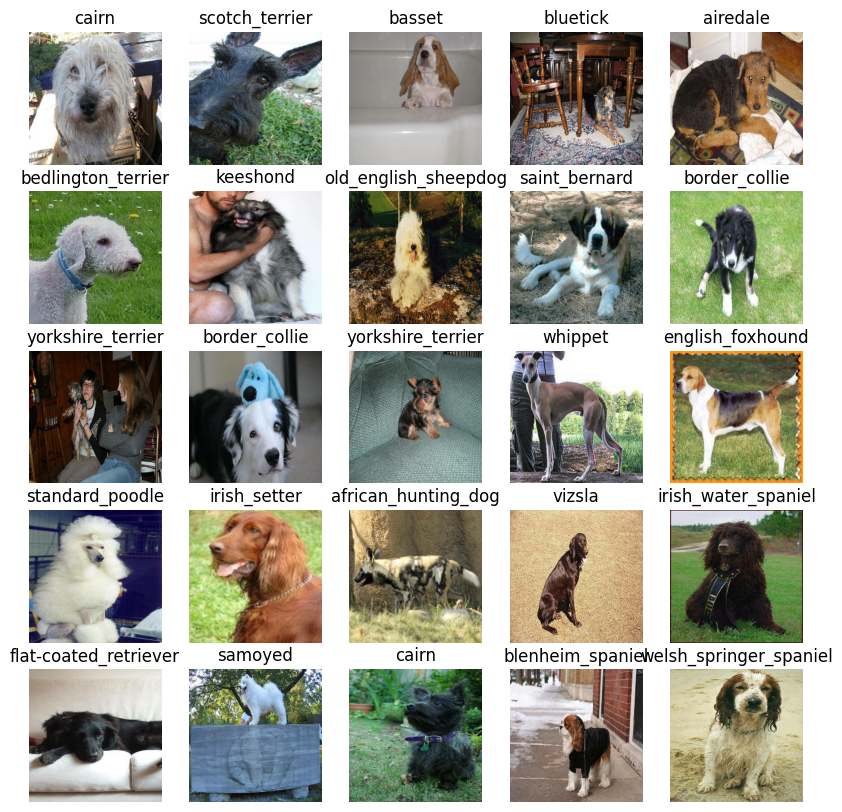

In [ ]:
# now the same for validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build the model, there are things we need to define:
* the input shape our images in the form of tensors to the model
* the output shape our labels in the form of tensors to the model
* the url of the model we wanna use

In [ ]:
#setup input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

#setup output shape
OUTPUT_SHAPE = len(unique_breeds)

#setup model url from tensorhub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
# #create a function which builds a keras model
# def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
#   print("Building model with: " , MODEL_URL)

#   #setup model layers
#   model = tf.keras.Sequential([
#     hub.KerasLayer(MODEL_URL), # layer 1 input
#     tf.keras.layers.Dense(units=OUTPUT_SHAPE,
#                                                     activation="softmax") #layer 2 output
#   ])

#   #compile model
#   model.compile(
#       loss=tf.keras.losses.CategoricalCrossentropy(),
#       omptimizer=tf.keras.optimizers.Adam(),
#       metrics=["accuracy"]
#   )

#   #build the model
#   model.build(INPUT_SHAPE)

#   return model

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks
We've got a model ready to go but before we train it we'll make some callbacks.

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

## TensorBoard Callback
TensorBoard helps provide a visual way to monitor the progress of your model during and after training.

It can be used directly in a notebook to track the performance measures of a model such as loss and accuracy.

To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory
3. and pass it to our model's fit() function.
   Visualize the our models training logs using the %tensorboard magic function (we'll do this later on).

In [ ]:
#Load tensorboard notebook extention
%load_ext tensorboard

In [ ]:
import datetime

#Create a function to build a tensorboard callback
def create_tb_callback():
  #create a log directory for storing tensorboard logs
  logdir = os.path.join("drive/MyDrive/Dog Breed Recognition/logs",
                        #make it so the logs get tracked everytime we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback
Ealy stopping is meant to prevent a model from overfitting which would make it not generalized

In [ ]:
#create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training A Model (on a subset of data)

Our first model is only gonna train on 1000 images to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Lets write a function which train a model.

* create a model using `create_model()`
* setup a tensorboard callback using `create_tensorboard_callback()`
* call the `fit()` function on our model passing it the training_data, validation_data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks which are helper functions we'd like to use
* return a model

In [ ]:
#Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #create a model
  model = create_model()

  #create a new tensorboard session everytime we train a model
  tensorboard = create_tb_callback()

  #fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  #return fitted model
  return model

In [ ]:
#fit model to data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 10s 220ms/step - loss: 4.5914 - accuracy: 0.0925 - val_loss: 3.3608 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 4s 164ms/step - loss: 1.6328 - accuracy: 0.7000 - val_loss: 2.1826 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 5s 211ms/step - loss: 0.5576 - accuracy: 0.9388 - val_loss: 1.7267 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 4s 165ms/step - loss: 0.2506 - accuracy: 0.9862 - val_loss: 1.5344 - val_accuracy: 0.6200
Epoch 5/100
25/25 [==============================] - 4s 165ms/step - loss: 0.1460 - accuracy: 0.9962 - val_loss: 1.4512 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 4s 146ms/step - loss: 0.1001 - accuracy: 1.0000 - val_loss: 1.4059 - val_accuracy: 0.6500
Epoch 7/100
25/25 [=============================

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Breed\ Recognition/logs

Reusing TensorBoard on port 6006 (pid 11401), started 0:00:08 ago. (Use '!kill 11401' to kill it.)

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model



In [ ]:
#make predictions on the validation data
predictions = model.predict(val_data,
                            verbose=1)
predictions

7/7 [==============================] - 2s 157ms/step


array([[6.8592359e-05, 2.8024981e-04, 5.3477613e-04, ..., 3.4761048e-05,
        3.9523616e-03, 1.0487022e-04],
       [4.4140665e-04, 1.1775560e-03, 5.8437468e-05, ..., 1.4966885e-03,
        6.7354541e-04, 1.1206888e-04],
       [1.8026470e-04, 1.5258230e-04, 1.8069320e-03, ..., 9.5956690e-05,
        4.9142784e-04, 1.3016333e-05],
       ...,
       [3.0458718e-06, 3.0815041e-05, 1.5124518e-06, ..., 5.3785016e-06,
        8.2462611e-06, 6.4319515e-06],
       [2.8068403e-04, 1.1004052e-04, 5.5026142e-03, ..., 1.3434226e-04,
        2.0401580e-04, 6.6873635e-04],
       [1.7683657e-02, 1.6573492e-04, 4.1707121e-05, ..., 4.3112892e-04,
        3.2504064e-05, 1.1139635e-03]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0]

array([6.85923587e-05, 2.80249806e-04, 5.34776133e-04, 9.41952632e-04,
       5.50679862e-04, 1.66556693e-03, 2.80093627e-05, 4.65263816e-04,
       7.40528014e-03, 3.10504656e-05, 4.45273763e-04, 4.06899303e-03,
       3.54348943e-02, 9.14769771e-04, 9.51241782e-06, 8.98845319e-04,
       4.65473346e-03, 3.37630016e-04, 1.54940470e-03, 6.81015244e-03,
       2.52740197e-02, 4.31390828e-04, 9.45893757e-04, 2.98478484e-01,
       1.44626806e-03, 7.90814884e-05, 8.01990518e-06, 2.94312224e-04,
       1.76457615e-04, 1.36504328e-04, 4.90088481e-04, 2.01113398e-05,
       9.15401091e-04, 2.44595543e-01, 1.40362177e-02, 2.08652951e-03,
       1.00972401e-02, 1.08901197e-02, 7.24690399e-05, 1.88132799e-05,
       8.11822247e-05, 1.60526499e-04, 9.80840065e-03, 3.95799638e-04,
       8.79429397e-04, 1.75372101e-04, 4.66156525e-05, 1.23434700e-04,
       7.22753757e-05, 3.71021181e-02, 6.65206171e-04, 1.43752375e-04,
       5.46223746e-05, 6.78904689e-05, 7.42803386e-05, 5.91813077e-05,
      

In [ ]:
#first prediction
index = 42
print(predictions[index])
print(f"max value (probability){np.max(predictions[index])}")
print(f"sum {np.sum(predictions[index])}")
print(f"max index {np.argmax(predictions[index])}")
print(f"predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.87093057e-04 5.98207771e-05 3.91140456e-05 1.23321253e-03
 1.39157914e-04 1.51856348e-05 4.46108934e-05 1.23602315e-03
 7.73512584e-05 7.70150145e-05 8.15979183e-01 1.47948173e-04
 7.67705351e-05 1.46170914e-05 1.66589243e-03 5.74157399e-04
 1.67410952e-04 1.54953173e-04 5.27580341e-05 1.79497845e-04
 2.83092322e-05 3.76632088e-05 8.47883784e-05 2.43460381e-05
 3.15331054e-05 1.71892840e-04 5.52409037e-04 1.84868040e-04
 2.54704384e-04 2.58592663e-05 2.55265732e-05 1.32033703e-04
 4.22039302e-05 1.96812398e-04 1.73057051e-04 4.61204309e-06
 2.66485931e-05 1.06335472e-04 4.78997717e-05 1.36828516e-04
 6.23769942e-04 1.45312464e-02 9.93258145e-05 8.14108535e-06
 1.56791371e-04 8.14441300e-05 8.76199556e-05 5.92182274e-04
 1.84576584e-05 5.10509562e-06 1.02566862e-02 1.86989164e-05
 1.09810586e-04 2.92531040e-05 1.34232780e-03 3.76558091e-05
 6.83535109e-05 3.08705319e-04 4.31323933e-05 7.69787512e-05
 1.18746057e-05 1.07437590e-04 3.66981585e-05 1.22631291e-05
 3.82518665e-05 4.789926

Having this information is great but it would be even better if we could compare a prediction to its true label and original image.

To help us, let's first build a little function to convert prediction probabilities into predicted labels.

**Note**: Prediction probabilities are also known as confidence levels.

In [ ]:
#Turn prediction probabilites into their respective label

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Since our validation data (val_data) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using unbatch()) and then turn it into an iterator using as_numpy_iterator().

In [ ]:
# Create a function to unbatch a batch dataset

def unbatching(dataset):
  """
  Takes dataset and returns a humanized list of labels and images
  """

  #Create empty dictionaries
  images = []
  labels = []

  #loop through the dataset
  for image, label in dataset.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatching(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(predictions[0])

'cairn'

In [ ]:
get_pred_label(val_labels[0])

'boston_bull'

Now weve got ways to get:
* prediction labels
* validation labels
* validation images

lets make some functions to make these all a bit more visual

well create a function which takes:
* an array of prediction probabilities and an array of truth labels and an array of images and integers
* convert the prediction probabilities to a predicted label
* plot the predicted label its predicted probability the truth label and the target image on a single plot

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

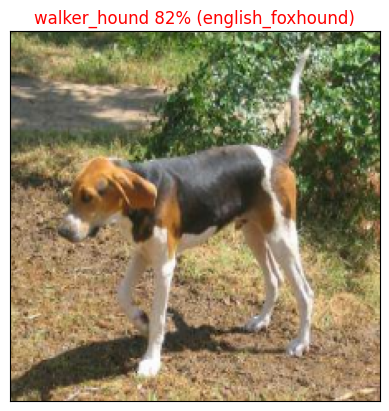

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

Since we're working with a multi-class problem (120 different dog breeds), it would also be good to see what other guesses our model is making. More specifically, if our model predicts a certain label with 24% probability, what else did it predict?

Let's build a function to demonstrate. The function will:
* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using `get_pred_label()`.
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

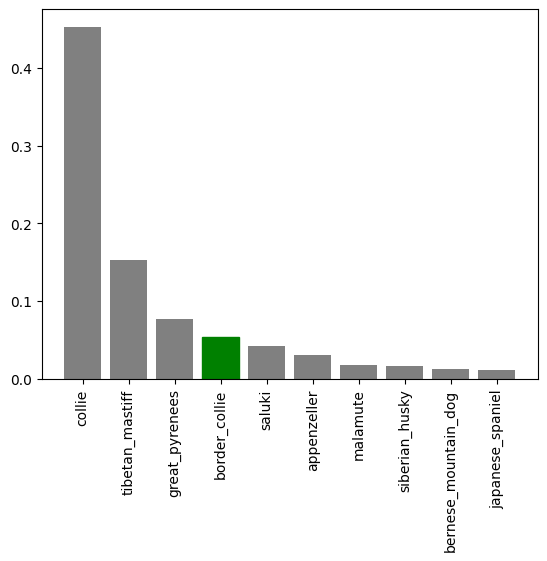

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

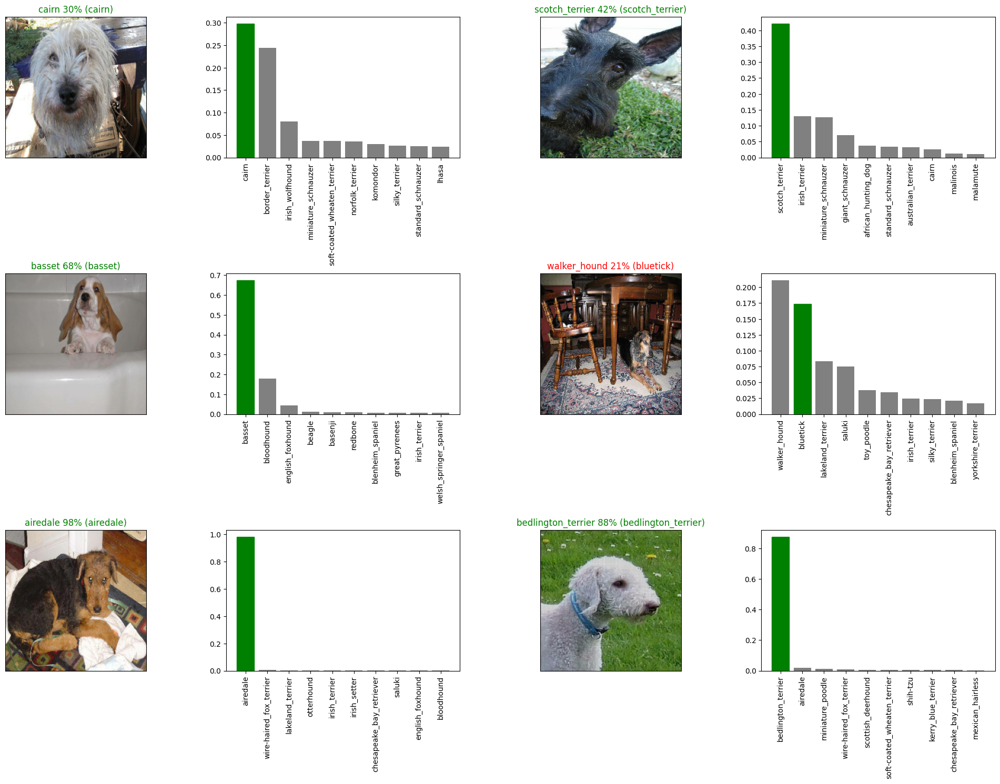

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving & loading a model

After training a model, it's a good idea to save it. Saving it means you can share it with colleagues, put it in an application and more importantly, won't have to go through the potentially expensive step of retraining it.



In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  #create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Breed Recognition/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam-v2")

Saving model to: drive/MyDrive/Dog Breed Recognition/models/20241105-14231730816581-1000-images-mobilenetv2-Adam-v2.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Breed Recognition/models/20241105-14231730816581-1000-images-mobilenetv2-Adam-v2.h5'

In [ ]:
#Load a trained model
loaded_1000_image_adam_model = load_model("drive/MyDrive/Dog Breed Recognition/models/20241105-14231730816581-1000-images-mobilenetv2-Adam-v2.h5")

Loading saved model from: drive/MyDrive/Dog Breed Recognition/models/20241105-14231730816581-1000-images-mobilenetv2-Adam-v2.h5


In [ ]:
#Evaluate a presaved model
model.evaluate(val_data)

7/7 [==============================] - 1s 111ms/step - loss: 1.3345 - accuracy: 0.6500


[1.3344535827636719, 0.6499999761581421]

In [ ]:
#Evaluate a loaded model
loaded_1000_image_adam_model.evaluate(val_data)

7/7 [==============================] - 2s 105ms/step - loss: 1.3345 - accuracy: 0.6500


[1.3344535827636719, 0.6499999761581421]

## Training a model (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
#Create a data batch with the full dataset
full_data = create_data_batchs(X, y)

Creatign training data batchs...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
#create full model callbacks
full_model_tensorboard = create_tb_callback()
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Since running the cell below will cause the model to train on all of the data (10,000+) images, it may take a fairly long time to get started and finish. However, thanks to our full_model_early_stopping callback, it'll stop before it starts going too long.

In [ ]:
#fit the full model
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping],
               )

Epoch 1/100
320/320 [==============================] - 49s 139ms/step - loss: 1.3397 - accuracy: 0.6707
Epoch 2/100
320/320 [==============================] - 42s 132ms/step - loss: 0.4011 - accuracy: 0.8851
Epoch 3/100
320/320 [==============================] - 42s 132ms/step - loss: 0.2368 - accuracy: 0.9360
Epoch 4/100
320/320 [==============================] - 44s 136ms/step - loss: 0.1548 - accuracy: 0.9625
Epoch 5/100
320/320 [==============================] - 42s 132ms/step - loss: 0.1069 - accuracy: 0.9776
Epoch 6/100
320/320 [==============================] - 41s 130ms/step - loss: 0.0778 - accuracy: 0.9870
Epoch 7/100
320/320 [==============================] - 42s 132ms/step - loss: 0.0599 - accuracy: 0.9905
Epoch 8/100
320/320 [==============================] - 45s 140ms/step - loss: 0.0468 - accuracy: 0.9942
Epoch 9/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0387 - accuracy: 0.9949
Epoch 10/100
320/320 [==============================] - 44s 137m

In [ ]:
save_model(full_model, suffix="full_data-mobilenetv2-Adam-v2")

Saving model to: drive/MyDrive/Dog Breed Recognition/models/20241105-15101730819416-full_data-mobilenetv2-Adam-v2.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Breed Recognition/models/20241105-15101730819416-full_data-mobilenetv2-Adam-v2.h5'

In [ ]:
loaded_full_model = load_model("drive/MyDrive/Dog Breed Recognition/models/20241105-15101730819416-full_data-mobilenetv2-Adam-v2.h5")

Loading saved model from: drive/MyDrive/Dog Breed Recognition/models/20241105-15101730819416-full_data-mobilenetv2-Adam-v2.h5


## Making predictions on the test data set

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.


Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the `predict()` function.


In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Breed Recognition/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Breed Recognition/test/e527455253416f809a73886b6003020d.jpg',
 'drive/MyDrive/Dog Breed Recognition/test/df645ae75554d4d7130bfa1b72be53ce.jpg',
 'drive/MyDrive/Dog Breed Recognition/test/e2c3376aeea1057337f02dfc48feee62.jpg',
 'drive/MyDrive/Dog Breed Recognition/test/e6da14858db7781843db6af91551f627.jpg',
 'drive/MyDrive/Dog Breed Recognition/test/e4d878f113883a3caab47d3126d2c2a4.jpg',
 'drive/MyDrive/Dog Breed Recognition/test/e6920cc0fd2e3099506d23761d9682e1.jpg',
 'drive/MyDrive/Dog Breed Recognition/test/dd1eddb779b2611cdd42de48ae623a62.jpg',
 'drive/MyDrive/Dog Breed Recognition/test/dd8d95720349f85d2a795adaafc71172.jpg',
 'drive/MyDrive/Dog Breed Recognition/test/e7f95aabf775a636b3893ffa120adaf9.jpg',
 'drive/MyDrive/Dog Breed Recognition/test/e2faaf5e760a6189d0980e6355864b4c.jpg']

In [ ]:
# How many test images are there?
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batchs(test_filenames, test_data=True)

Creating test data batchs...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Since there are 10,000+ test images, making predictions could take a while, even on a GPU. So beware running the cell below may take up to an hour.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 362s 1s/step


In [ ]:
#save predictions to a numpy array
np.savetxt("drive/MyDrive/Dog Breed Recognition/preds_array.csv", delimiter=",")

In [ ]:
#load predictions from numpy array
test_predictions = np.loadtxt("drive/MyDrive/Dog Breed Recognition/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

In [ ]:
test_predictions.shape

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, it looks like they want the models output probabilities each for label along with the image ID's.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation


To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the `unique_breeds` list and the `test_predictions` list.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

In [ ]:
# Append test image ID's to predictions DataFrame
test_path = "drive/MyDrive/Dog Breed Recognition/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
preds_df.to_csv("drive/MyDrive/Dog Breed Recognition/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

## Making predictions on custom images

It's great being able to make predictions on a test dataset already provided for us.

But how could we use our model on our own images?

The premise remains, if we want to make predictions on our own custom images, we have to pass them to the model in the same format the model was trained on.

To do so, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.





In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Breed Recognition/dogs"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)